In [1]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import seaborn as sns

In [2]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.22 GB, difference +0.22 GB
scanpy==1.10.2 anndata==0.10.8 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.0.3 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [3]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *

In [4]:
import matplotlib as mpl
mpl.rc("font", family = "Arial")
mpl.rcParams["pdf.fonttype"] = 42
mpl.rcParams["ps.fonttype"] = 42


In [5]:
#home_dir = os.path.expanduser("~")
current_directory = os.getcwd()
adata = sc.read_h5ad(current_directory+"/backups/global_and_facs_104832x37733_250218_08h47.h5ad")

In [8]:
# Recode
renamer_sample = {
    "WBC5": "HD1",
    "WBC5_D": "HD4",
    "1-FM02-NP0000008": "HD2",
    "2-FM02-NP0000011": "HD3",
    
    "1-FM02-NP0000004": "GCSF1",
    "2-FM02-NP0000012": "GCSF2",
    "1-FM02-NP0000026": "GCSF3",
    "1-FM02-NP0000027": "GCSF4",
    "1-FM02-NP0000039": "GCSF5",

    "1-FM02-NP0000010": "AML1",
    "1-FM02-NP0000014": "AML2",
    "5-FM02-NP0000024": "AML3",
    "1-FM02-NP0000029": "AML4",
    "1-FM02-NP0000032": "AML5",
    "1-FM02-NP0000041": "AML6",
    "1-FM02-NP0000045": "AML7",
    "1-FM02-NP0000046": "AML8",

    "2-FM02-NP0000014": "AML2",
    "5-FM02-NP0000029": "AML4",
    "2-FM02-NP0000041": "AML6",
    "2-FM02-NP0000045": "AML7",
    
    "1;2-FM02-NP0000042": "NT1-1",
    "5;6-FM02-NP0000042": "NT1-2",
    "1;2-FM02-NP0000036": "NT2-1",
    "5-FM02-NP0000036": "NT2-2",
    "1;2-FM02-NP0000034": "NT4-1",
    "5;6-FM02-NP0000034": "NT4-2",
    "1;2;5;6-FM02-NP0000049": "NT7-1",
    "1;2-FM02-NP0000050": "NT8-1",
    "5;6-FM02-NP0000050": "NT8-2",

    "5;6-FM02-NP0000035": "NT9-1",
    "5;6-FM02-NP0000037": "NT10-1",
    "1;2-FM02-NP0000043": "NT11-1"
}
adata.obs["code_renamed"] = [renamer_sample[i] for i in adata.obs["code"]]


In [9]:
# dictionary for renaming
rename_dict = {
    "Cycling B cells" : "B cells",
    "Cycling T cells" : "T cells",

    "Tem/Temra cytotoxic T cells": "T cells",
    "Tem/Effector helper T cells": "T cells",
    "Tcm/Naive helper T cells": "T cells",
    "Tcm/Naive cytotoxic T cells": "T cells",
    "MAIT T cells": "T cells",
    "Regulatory T cells": "T cells",
    "Precursors of Neutrophils": "Immature Neutrophils",
    "Early Immature Neutrophils": "Immature Neutrophils",
    "Immature Neutrophils": "Immature Neutrophils",
    "Mature Neutrophils": "Mature Neutrophils",
    "Aged Neutrophils": "Mature Neutrophils",
    "CD14 Monocytes": "Monocytes/Myelomonocytes",
    "CD16 Monocytes": "Monocytes/Myelomonocytes",
    
    "cDC": "Dendritic cells",
    "pDC": "Dendritic cells",
    "Naive B cells": "B cells",
    "Memory B cells": "B cells",
    "Plasma cells": "B cells",
    "NK cells": "NK cells",
    "Basophils": "Basophils",
    "Platelets": "Platelets",
    "Erythrocytes": "Erythrocytes",

    "AML cells 1": "AML cells",
    "AML cells 2": "AML cells",
    "AML cells 3": "AML cells",
    "AML cells 4": "AML cells",
    "AML cells 5": "AML cells",
    "AML cells 6": "AML cells",
    "AML cells 7": "AML cells",
    "AML cells 8": "AML cells",
    "AML cells 9": "AML cells",
    "AML cells 10": "AML cells",

    "Cycling AML cells 1": "Cycling AML cells",
    "Cycling AML cells 2": "Cycling AML cells",
    "Cycling AML Monocytes": "Cycling AML cells",


    "AML Monocytes 1": "Monocytes/Myelomonocytes",
    "AML Monocytes 2": "Monocytes/Myelomonocytes",
}


# Rename cell types and filter
adata.obs["cell_type_global_simplified"] = adata.obs["cell_type_sub_prolif_anno"].map(rename_dict)
# Convert the new column to categorical type
adata.obs["cell_type_global_simplified"] = pd.Categorical(adata.obs["cell_type_global_simplified"])

In [10]:
cell_type_color_palette_simplified = {
    "Monocytes/Myelomonocytes": "#2041c7", 
    "T cells": "#1b544c", 
    "B cells": "#f2836f",
    "NK cells": "#3bad48", 
    "Mature Neutrophils": "#532b6b", 
    "Basophils": "#2d4173",
    "Immature Neutrophils": "#9846a8",
    "Dendritic cells": "#602ab0",
    "AML cells": "#73472a",
    "Cycling AML cells": "#bf4a2e",
    "Platelets": "#b06c6c",
    "Erythrocytes": "#db2f2c",


}

cell_type_color_palette = {
"AML cells 1": "#73472a",
"AML cells 2": "#9e5423",
"AML cells 3": "#ab3803",
"AML cells 4": "#eb8f1e",
"AML cells 5": "#f2621f",
"AML cells 6": "#ad0e0e",
"AML cells 7": "#cc1c00",
"AML cells 8": "#db5a46",
"AML cells 9": "#b85c38",
"AML cells 10": "#e07c57",

"Cycling AML cells 1": "#bf4a2e",
"Cycling AML cells 2": "#d96e3a",

"AML Monocytes 1": "#8a0303",
"AML Monocytes 2": "#ff7043",

"Cycling AML Monocytes": "#c4371d",

"Platelets": "#b06c6c",
"Erythrocytes": "#db2f2c",

"Naive B cells": "#f2836f",
"Memory B cells": "#d65a5a",
"Plasma cells": "#820505",
    
"Cycling B cells": "#a83232",

"CD14 Monocytes": "#2041c7",
"CD16 Monocytes": "#007bff",
"cDC": "#477ead",

"pDC": "#602ab0", 
"Basophils": "#2d4173",

"Precursors of Neutrophils": "#84619c",
"Early Immature Neutrophils": "#d658f5",
"Immature Neutrophils": "#9846a8",
"Mature Neutrophils": "#532b6b",
"Aged Neutrophils": "#943886",

"Tem/Temra cytotoxic T cells": "#596e32",
"Tem/Effector helper T cells": "#4f9e58",
"Tcm/Naive helper T cells": "#1b544c",
"Tcm/Naive cytotoxic T cells": "#21661e",
"MAIT T cells": "#62a87e", 
"Regulatory T cells": "#44ab89",
"Cycling T cells" : "#2abf9a",
"NK cells": "#3bad48",
}


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

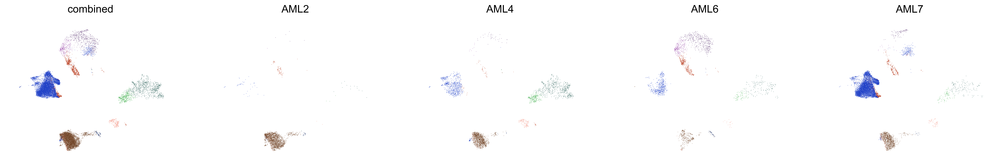

In [86]:
facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


thresholds = [0, 2, 4, 6, 8, 10]

mask_all = (adata_randomized.obs["batch"] == "facs") & ((adata_randomized.obs["code_renamed"] == "AML2") | (adata_randomized.obs["code_renamed"] == "AML4") | (adata_randomized.obs["code_renamed"] == "AML6") | (adata_randomized.obs["code_renamed"] == "AML7"))
mask_aml2 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML2")
mask_aml4 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML4")
mask_aml6 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML6")
mask_aml7 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML7")

masks = [mask_all, mask_aml2, mask_aml4, mask_aml6, mask_aml7]
patients = ["combined", "AML2", "AML4", "AML6", "AML7"]

ncols = 5
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()

for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin" 
    else:
        legend_loc_val = False
    
    sc.pl.umap(
        adata_randomized[mask],
        color="cell_type",
        size=1,
        alpha=1,
        frameon=False,
        use_raw=False,
        ax=ax,
        palette=cell_type_color_palette_simplified,
        #legend_loc = "on data",
        legend_loc = None, #legend_loc_val
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_on_global_umap_coord_aml2_aml4_aml6_aml7_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

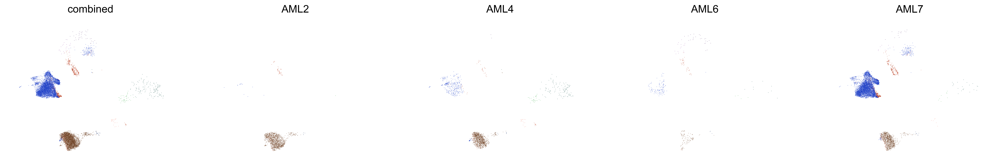

In [12]:
facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]
adata_randomized = adata_randomized[(adata_randomized.obs["facs"] == "positive")]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


thresholds = [0, 2, 4, 6, 8, 10]

mask_all = (adata_randomized.obs["batch"] == "facs") & ((adata_randomized.obs["code_renamed"] == "AML2") | (adata_randomized.obs["code_renamed"] == "AML4") | (adata_randomized.obs["code_renamed"] == "AML6") | (adata_randomized.obs["code_renamed"] == "AML7"))
mask_aml2 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML2")
mask_aml4 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML4")
mask_aml6 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML6")
mask_aml7 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML7")

masks = [mask_all, mask_aml2, mask_aml4, mask_aml6, mask_aml7]
patients = ["combined", "AML2", "AML4", "AML6", "AML7"]

ncols = 5
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()


for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin" 
    else:
        legend_loc_val = False
    
    sc.pl.umap(
        adata_randomized[mask],
        color="cell_type",
        size=1,
        alpha=1,
        frameon=False,
        use_raw=False,
        ax=ax,
        palette=cell_type_color_palette_simplified,
        legend_loc = False, #legend_loc_val,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")

    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")
plt.savefig("figures/final/facs_positive_on_global_umap_coord_aml2_aml4_aml6_aml7_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

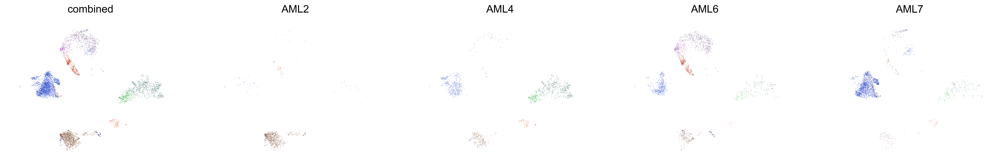

In [17]:
facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]
adata_randomized = adata_randomized[(adata_randomized.obs["facs"] == "negative")]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


thresholds = [0, 2, 4, 6, 8, 10]

mask_all = (adata_randomized.obs["batch"] == "facs") & ((adata_randomized.obs["code_renamed"] == "AML2") | (adata_randomized.obs["code_renamed"] == "AML4") | (adata_randomized.obs["code_renamed"] == "AML6") | (adata_randomized.obs["code_renamed"] == "AML7"))
mask_aml2 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML2")
mask_aml4 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML4")
mask_aml6 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML6")
mask_aml7 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML7")

masks = [mask_all, mask_aml2, mask_aml4, mask_aml6, mask_aml7]
patients = ["combined", "AML2", "AML4", "AML6", "AML7"]

ncols = 5
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()


for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin"
    else:
        legend_loc_val = False
    
    sc.pl.umap(
        adata_randomized[mask],
        color="cell_type",
        size=1,
        alpha=1,
        frameon=False,
        use_raw=False,
        ax=ax,
        palette=cell_type_color_palette_simplified,
        legend_loc = False, #legend_loc_val,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_negative_on_global_umap_coord_aml2_aml4_aml6_aml7_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


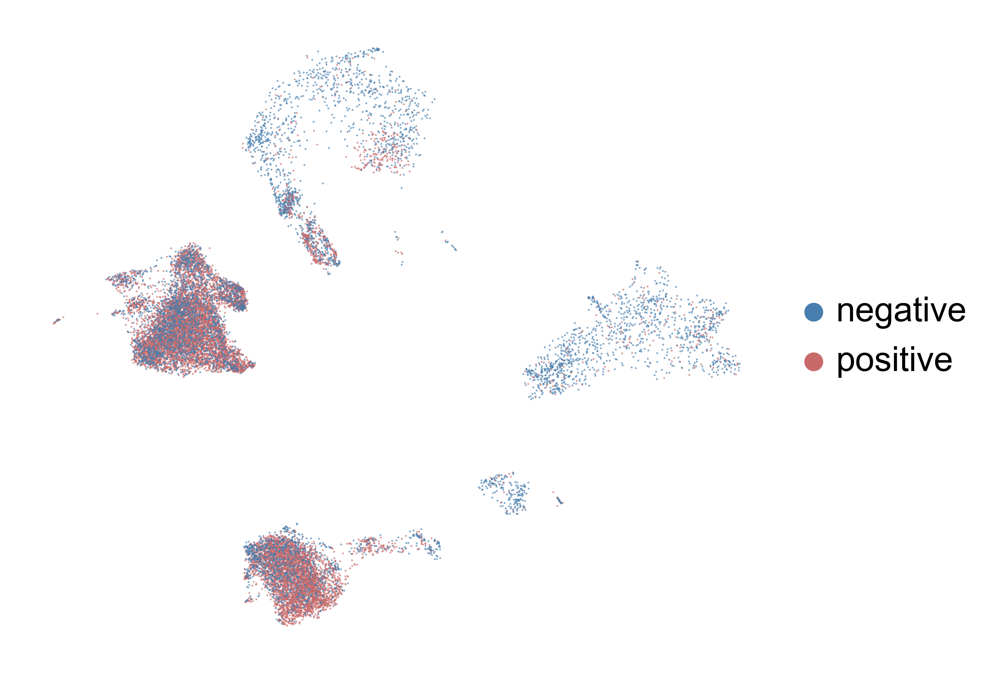

In [49]:
sc.settings.set_figure_params(dpi = 300, dpi_save = 1200, transparent = True, figsize = (5, 5), vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))

adata.obs["cell_type_ordered"] = pd.Categorical(values = adata.obs.cell_type, categories = cell_type_color_palette_simplified.keys(), ordered = True)


adata_randomized = adata[(adata.obs["batch"] == "facs")]


facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}


fig = sc.pl.umap(adata_randomized, color = ["facs"], 
                 alpha = 0.66, 
                 s = 2,
                 frameon = False, title = "",
                 #legend_loc = "on data", 
                 #legend_fontsize = 10, 
                 #legend_fontoutline = True,
                 palette = facs_color_palette,
                 layer = "counts", use_raw=False,
                 vmin = "0", vmax = "15", 
                 cmap=sns.blend_palette(["white", sns.xkcd_rgb["blood"]], as_cmap=True),
                 show = False, return_fig = True)


fig.axes[0].set_aspect("equal")

fig.savefig("figures/final/facs_on_global_umap_v1.pdf", bbox_inches="tight")

adata.obs.drop("cell_type_ordered", axis = 1, inplace = True)

/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

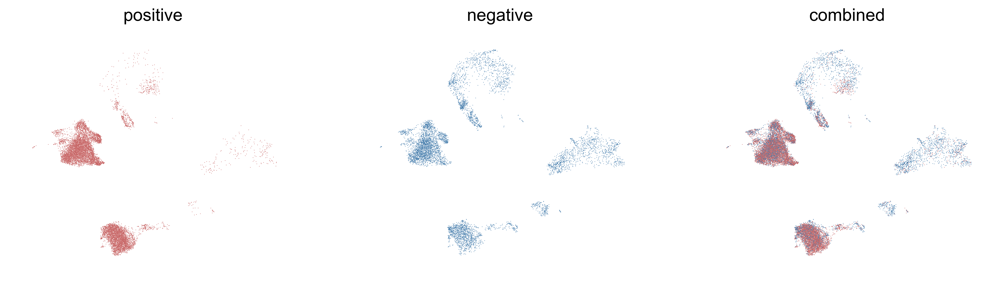

In [82]:
facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


positive_negative = (adata_randomized.obs["facs"] == "positive") | (adata_randomized.obs["facs"] == "negative")
positive = (adata_randomized.obs["facs"] == "positive")
negative = (adata_randomized.obs["facs"] == "negative")


masks = [positive, negative, positive_negative]
patients = ["positive", "negative", "combined"]

ncols = 3
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()

for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin"
    else:
        legend_loc_val = False
    
    sc.pl.umap(
        adata_randomized[mask],
        color="facs",
        size=1,
        alpha=1,
        frameon=False,
        #vmax="p99.5",
        use_raw=False,
        ax=ax,
        palette=facs_color_palette,
        #legend_loc = "on data",
        legend_loc = False,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_positive_negative_on_global_umap_coord_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

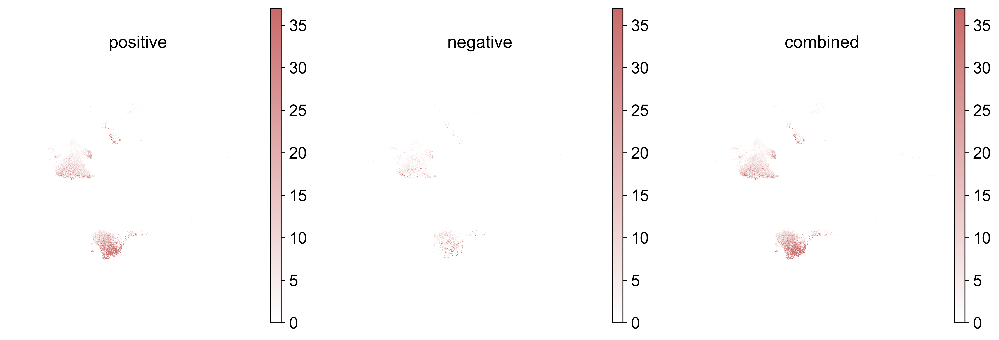

In [14]:
from scipy.sparse import issparse


facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


positive_negative = (adata_randomized.obs["facs"] == "positive") | (adata_randomized.obs["facs"] == "negative")
positive = (adata_randomized.obs["facs"] == "positive")
negative = (adata_randomized.obs["facs"] == "negative")

masks = [positive, negative, positive_negative]
patients = ["positive", "negative", "combined"]

ncols = 3
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()

for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin"
    else:
        legend_loc_val = False

    gene_data = adata_randomized[positive_negative][:, "MIR181A1HG"].layers["counts"]
    if issparse(gene_data):
        gene_data = gene_data.toarray().flatten()
    else:
        gene_data = gene_data.flatten()
    
    global_vmax = np.percentile(gene_data, 97.5)

    
    
    sc.pl.umap(
        adata_randomized[mask],
        color="MIR181A1HG",
        size=1,
        alpha=1,
        frameon=False,
        layer = "counts", use_raw=False,
        vmax = global_vmax,
        cmap=sns.blend_palette(["white", "#c96a6a"], as_cmap=True), #cmap=sns.blend_palette(["white", "#c96a6a"], as_cmap=True), #E0E0E0 and #EEEEEE lightgray
        ax=ax,
        #legend_loc = "on data",
        #colorbar_loc = None, # without color bar
        legend_loc = False,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_positive_negative_on_global_umap_coord_MIR181A1HG_raw_counts_p97.5_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

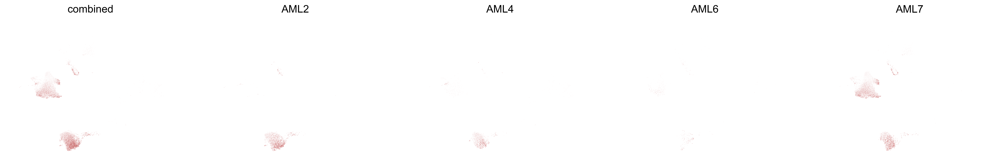

In [85]:
# MIR expression per patient

from scipy.sparse import issparse


facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()

positive_negative = (adata_randomized.obs["facs"] == "positive") | (adata_randomized.obs["facs"] == "negative")
positive = (adata_randomized.obs["facs"] == "positive")
negative = (adata_randomized.obs["facs"] == "negative")

mask_all = (adata_randomized.obs["batch"] == "facs") & ((adata_randomized.obs["code_renamed"] == "AML2") | (adata_randomized.obs["code_renamed"] == "AML4") | (adata_randomized.obs["code_renamed"] == "AML6") | (adata_randomized.obs["code_renamed"] == "AML7"))
mask_aml2 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML2")
mask_aml4 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML4")
mask_aml6 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML6")
mask_aml7 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML7")

masks = [mask_all, mask_aml2, mask_aml4, mask_aml6, mask_aml7]
patients = ["combined", "AML2", "AML4", "AML6", "AML7"]

ncols = 5
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()

for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin"
    else:
        legend_loc_val = False

    gene_data = adata_randomized[mask_all][:, "MIR181A1HG"].layers["counts"]
    if issparse(gene_data):
        gene_data = gene_data.toarray().flatten()
    else:
        gene_data = gene_data.flatten()
    
    global_vmax = np.percentile(gene_data, 97.5)

    
    
    sc.pl.umap(
        adata_randomized[mask],
        color="MIR181A1HG",
        size=1,
        alpha=1,
        frameon=False,
        layer = "counts", use_raw=False,
        vmax = global_vmax,
        cmap=sns.blend_palette(["white", "#c96a6a"], as_cmap=True),
        colorbar_loc=None, # color bar
        ax=ax,
        #legend_loc = "on data",
        legend_loc = False,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_on_global_umap_coord_aml2_aml4_aml6_aml7_MIR181A1HG_raw_counts_p97.5_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

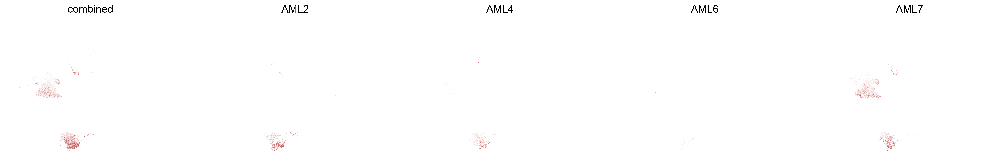

In [24]:
from scipy.sparse import issparse


facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead", 

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]
adata_randomized = adata_randomized[(adata_randomized.obs["facs"] == "positive")]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


positive_negative = (adata_randomized.obs["facs"] == "positive") | (adata_randomized.obs["facs"] == "negative")
positive = (adata_randomized.obs["facs"] == "positive")
negative = (adata_randomized.obs["facs"] == "negative")

mask_all_pn = (adata.obs["batch"] == "facs") & ((adata.obs["code_renamed"] == "AML2") | (adata.obs["code_renamed"] == "AML4") | (adata.obs["code_renamed"] == "AML6") | (adata.obs["code_renamed"] == "AML7"))


mask_all = (adata_randomized.obs["batch"] == "facs") & ((adata_randomized.obs["code_renamed"] == "AML2") | (adata_randomized.obs["code_renamed"] == "AML4") | (adata_randomized.obs["code_renamed"] == "AML6") | (adata_randomized.obs["code_renamed"] == "AML7"))
mask_aml2 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML2")
mask_aml4 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML4")
mask_aml6 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML6")
mask_aml7 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML7")

masks = [mask_all, mask_aml2, mask_aml4, mask_aml6, mask_aml7]
patients = ["combined", "AML2", "AML4", "AML6", "AML7"]

ncols = 5
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()

for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin"
    else:
        legend_loc_val = False

    
    gene_data = adata[mask_all_pn][:, "MIR181A1HG"].layers["counts"]
    if issparse(gene_data):
        gene_data = gene_data.toarray().flatten()
    else:
        gene_data = gene_data.flatten()
    
    global_vmax = np.percentile(gene_data, 97.5)

    
    sc.pl.umap(
        adata_randomized[mask],
        color="MIR181A1HG",
        size=1,
        alpha=1,
        frameon=False,
        layer = "counts", use_raw=False,
        vmax = global_vmax,
        cmap=sns.blend_palette(["white", "#c96a6a"], as_cmap=True),
        colorbar_loc=None, # color bar
        ax=ax,
        #legend_loc = "on data",
        legend_loc = False,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_positive_on_global_umap_coord_aml2_aml4_aml6_aml7_MIR181A1HG_raw_counts_p97.5_v2.pdf", bbox_inches="tight", transparent = True)

plt.show()


/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/denis/mambaforge/envs/capseq_dge/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to m

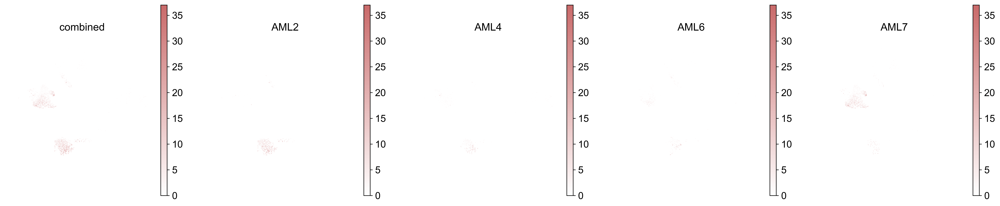

In [22]:
from scipy.sparse import issparse


facs_color_palette = {
"positive": "#c96a6a",
"negative": "#477ead",

}

sc.settings.set_figure_params(dpi = 300, 
                              dpi_save = 300, 
                              transparent = True, 
                              figsize = (5, 5), 
                              vector_friendly = False)

np.random.seed(69)
random_indices = np.random.permutation(list(range(adata.shape[0])))
adata_randomized = adata[random_indices, :]
adata_randomized = adata_randomized[(adata_randomized.obs["facs"] == "negative")]

umap_coords = adata.obsm['X_umap']
x_min, x_max = umap_coords[:, 0].min(), umap_coords[:, 0].max()
y_min, y_max = umap_coords[:, 1].min(), umap_coords[:, 1].max()


positive_negative = (adata_randomized.obs["facs"] == "positive") | (adata_randomized.obs["facs"] == "negative")
positive = (adata_randomized.obs["facs"] == "positive")
negative = (adata_randomized.obs["facs"] == "negative")



mask_all_pn = (adata.obs["batch"] == "facs") & ((adata.obs["code_renamed"] == "AML2") | (adata.obs["code_renamed"] == "AML4") | (adata.obs["code_renamed"] == "AML6") | (adata.obs["code_renamed"] == "AML7"))


mask_all = (adata_randomized.obs["batch"] == "facs") & ((adata_randomized.obs["code_renamed"] == "AML2") | (adata_randomized.obs["code_renamed"] == "AML4") | (adata_randomized.obs["code_renamed"] == "AML6") | (adata_randomized.obs["code_renamed"] == "AML7"))
mask_aml2 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML2")
mask_aml4 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML4")
mask_aml6 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML6")
mask_aml7 = (adata_randomized.obs["batch"] == "facs") & (adata_randomized.obs["code_renamed"] == "AML7")

masks = [mask_all, mask_aml2, mask_aml4, mask_aml6, mask_aml7]
patients = ["combined", "AML2", "AML4", "AML6", "AML7"]

ncols = 5
nrows = int(np.ceil(len(masks) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))

axes = axes.flatten()

for i, mask in enumerate(masks):
    ax = axes[i]

    if i == len(masks) - 1:
        legend_loc_val = "right margin" 
    else:
        legend_loc_val = False

    
    gene_data = adata[mask_all_pn][:, "MIR181A1HG"].layers["counts"]
    if issparse(gene_data):
        gene_data = gene_data.toarray().flatten()
    else:
        gene_data = gene_data.flatten()
    
    global_vmax = np.percentile(gene_data, 97.5)

    
    
    sc.pl.umap(
        adata_randomized[mask],
        color="MIR181A1HG",
        size=1,
        alpha=1,
        frameon=False,
        layer = "counts", use_raw=False,
        vmax = global_vmax,
        cmap=sns.blend_palette(["white", "#c96a6a"], as_cmap=True),
        #colorbar_loc=None, # color bar
        ax=ax,
        #legend_loc = "on data",
        legend_loc = False,
        legend_fontoutline = True,
        show=False
    )
    ax.set_aspect("equal")
    ax.set_xlim(x_min-2, x_max+2)
    ax.set_ylim(y_min-2, y_max+2)
    ax.set_title(f"{patients[i]}", fontsize=15)

for j in range(len(masks), len(axes)):
    axes[j].axis("off")

plt.savefig("figures/final/facs_negative_on_global_umap_coord_aml2_aml4_aml6_aml7_MIR181A1HG_raw_counts_p97.5_v1.pdf", bbox_inches="tight", transparent = True)

plt.show()
